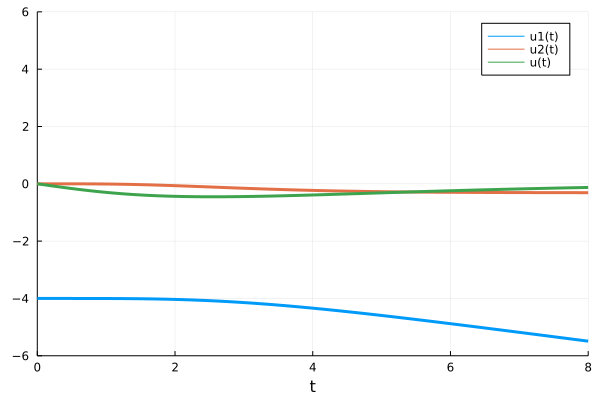

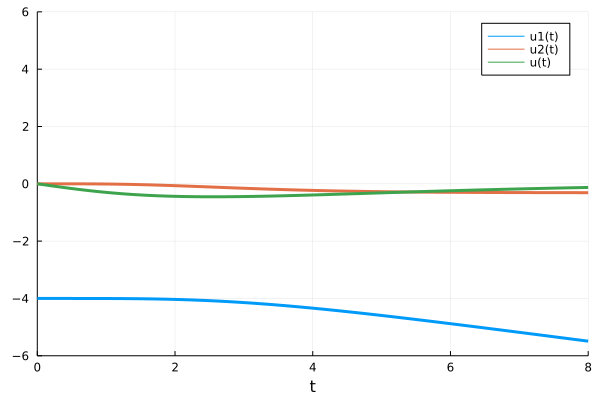

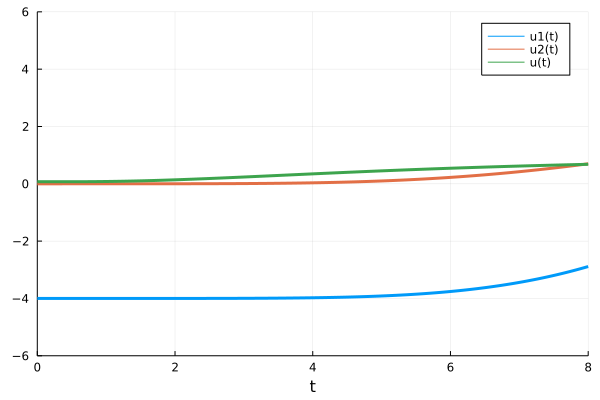

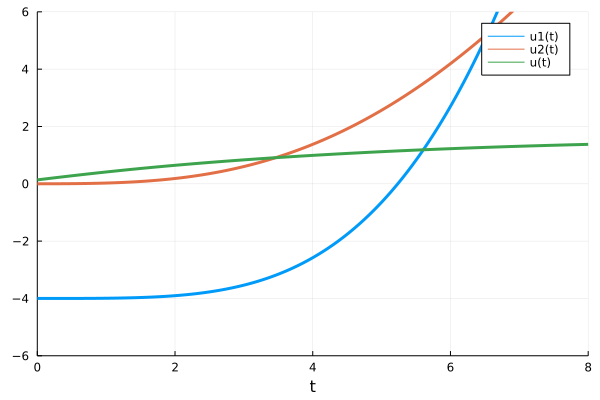

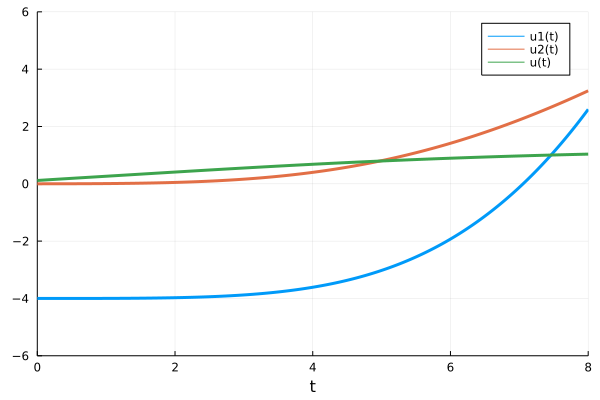

...

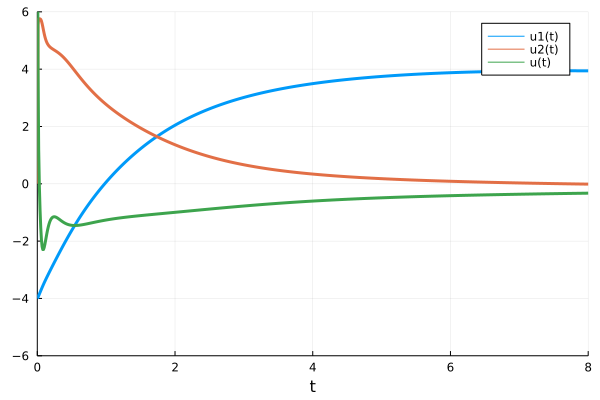

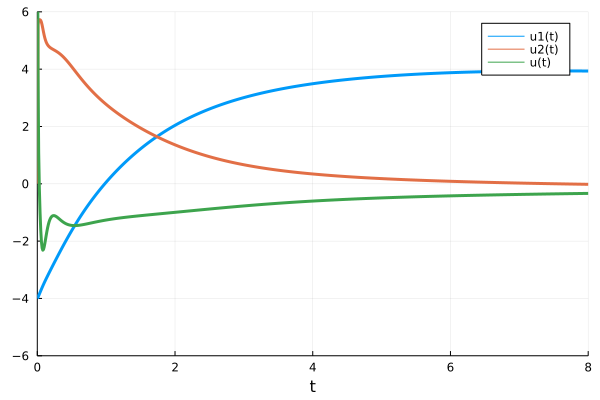

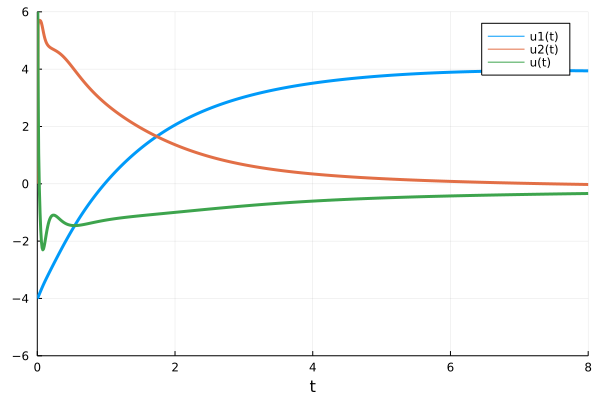

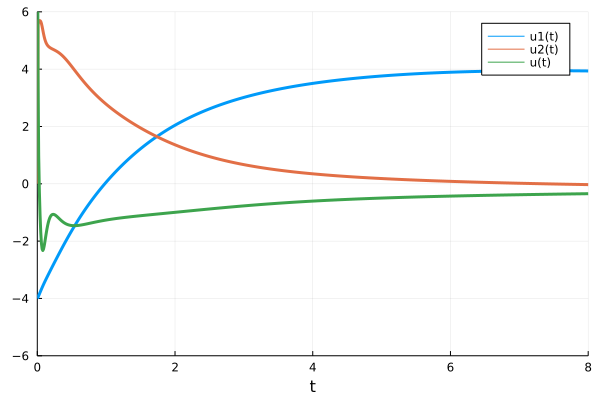

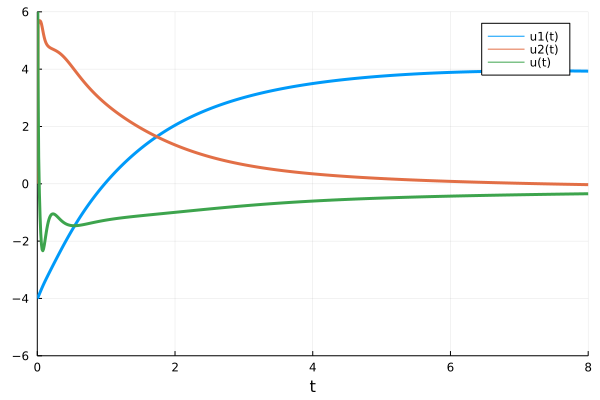

72.354227462973
72.354227462973
61.39102049027104
68.07860859938643
50.99420560437812
57.56004846963424
60.46874119807507
61.42982710794409
61.49470651116108
60.840584601821874
59.12547396395599
55.48458800288447
49.306008464309755
46.2280834433664
55.57352208755598
47.10319695760567
44.533143265056836
47.281111340630204
48.37982859700824
46.760565114119395
42.98401334244855
40.038657238942285
42.38677496096374
41.80230435315497
37.617894747616845
37.40878884670183
37.97513662078628
36.898638885185726
34.502134127145766
32.916627633042275
33.55348922539744
32.86139816896454
30.656232387840753
29.956551373020154
29.883279286173824
29.205849513366907
28.01988127419075
27.204408893147665
27.20952844110225
27.073544146070375
26.24883204426656
25.594825556764057
25.41687607373396
25.315056960771336
25.01796325111386
24.605831120999852
24.317490921902507
24.230614501816675
24.12629491955642
23.81386452631183
23.414528944569778
23.110065708111616
22.876113454890838
22.56099711964611
22.085018

u: 1153-element Vector{Float32}:
 -0.81043214
  3.7462764
 -6.910718
  2.8177955
 -1.5619218
  9.947483
  1.0062956
  2.750212
 -0.11977408
 -0.06619377
 -0.44389212
 -2.7543726
  5.53862
  ⋮
  1.2045641
 -0.85752416
 -3.4836504
  0.7134436
  0.07810988
 -0.5975763
 -5.0189676
  3.384565
  1.043489
  0.19685203
 -1.268064
  4.191441

In [1]:
using DiffEqFlux, DifferentialEquations, Plots, Statistics
tspan = (0.0f0,8.0f0)
ann = FastChain(FastDense(1,32,tanh), FastDense(32,32,tanh), FastDense(32,1))
θ = initial_params(ann)
function dxdt_(dx,x,p,t)
    x1, x2 = x
    dx[1] = x[2]
    dx[2] = ann([t],p)[1]^3
end
x0 = [-4f0,0f0]
ts = Float32.(collect(0.0:0.01:tspan[2]))
prob = ODEProblem(dxdt_,x0,tspan,θ)
solve(prob,Vern9(),abstol=1e-10,reltol=1e-10)
function predict_adjoint(θ)
  Array(solve(prob,Vern9(),p=θ,saveat=ts,sensealg=InterpolatingAdjoint(autojacvec=ReverseDiffVJP(true))))
end
function loss_adjoint(θ)
  x = predict_adjoint(θ)
  mean(abs2,4.0 .- x[1,:]) + 2mean(abs2,x[2,:]) + mean(abs2,[first(ann([t],θ)) for t in ts])/10
end
l = loss_adjoint(θ)
cb = function (θ,l)
  println(l)
  p = plot(solve(remake(prob,p=θ),Tsit5(),saveat=0.01),ylim=(-6,6),lw=3)
  plot!(p,ts,[first(ann([t],θ)) for t in ts],label="u(t)",lw=3)
  display(p)
  return false
end
# Display the ODE with the current parameter values.
cb(θ,l)
loss1 = loss_adjoint(θ)
res1 = DiffEqFlux.sciml_train(loss_adjoint, θ, ADAM(0.005), cb = cb,maxiters=100)
res2 = DiffEqFlux.sciml_train(loss_adjoint, res1.u,
                              BFGS(initial_stepnorm=0.01), cb = cb,maxiters=100,
                              allow_f_increases = false)

In [ ]:
tspan = (0.0f0,8.0f0)
ann = FastChain(FastDense(1,32,tanh), FastDense(32,32,tanh), FastDense(32,1))
θ = initial_params(ann)
function dxdt_(dx,x,p,t)
    x1, x2 = x
    dx[1] = x[2]
    dx[2] = ann([t],p)[1]^3
end
x0 = [-4f0,0f0]
ts = Float32.(collect(0.0:0.01:tspan[2]))
prob = ODEProblem(dxdt_,x0,tspan,θ)
solve(prob,Vern9(),abstol=1e-10,reltol=1e-10)